<a href="https://colab.research.google.com/github/Asha-Gutlapalli/Drug-Recommendation-System-based-on-the-Condition-of-the-Patient-using-BERT/blob/master/Drug_Recommendation_System_based_on_the_Condition_of_the_Patient_using_Bidirectional_Encoder_Representations_from_Transformers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Drug Recommendation based on Reviews and Conditions using Bidirectional Encoder Representation from Transformers**

### Install Libraries

In [ ]:
!pip install transformers
!pip install wget

     |████████████████████████████████| 778kB 2.7MB/s 
     |████████████████████████████████| 3.0MB 7.3MB/s 
     |████████████████████████████████| 890kB 23.2MB/s 
     |████████████████████████████████| 1.1MB 30.8MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp36-none-any.whl size=893260 sha256=a7ef0fd09a2c8f8e10802c33eb0deb904e55f298799b1fd023b5749754777fcc
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses
  Created wheel for wget: filename=wget-3.2-cp36-none-any.whl size=9682 sha256=cf749d2f150c61662417ff6ea776d0cd42966b7fb95abdfadcb4ac66d3026343
  Stored in directory: /root/.cache/pip/wheels/40/15/30/7d8f7cea2902b4db79e3fea550d7d7b85ecb27ef992b618f3f
Successfully built wget


### Import Packages

In [ ]:
import tensorflow as tf
import torch.nn as nn
import time
import random
from sklearn.metrics import matthews_corrcoef, accuracy_score
import datetime
import matplotlib.pyplot as plt
%matplotlib inline
from collections import Counter
import seaborn as sns
from transformers import get_linear_schedule_with_warmup
import numpy as np
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
import torch
from transformers import BertForSequenceClassification, AdamW, BertConfig
import wget
from torch.utils.data import TensorDataset, random_split
import os
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer
import pandas as pd

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Check your Hardware Accelerator

In [ ]:
dev_name = tf.test.gpu_device_name()

if dev_name == '/device:GPU:0':
    print('Device found at {}'.format(dev_name))
else:
    raise SystemError('Device not found')

Device found at /device:GPU:0


### Hardware Accelerator Details

In [ ]:
if torch.cuda.is_available():

  dev = torch.device("cuda")
  print("The number of %d GPUs are" % torch.cuda.device_count())
  print("The GPU name is", torch.cuda.get_device_name(0))

else:

  print("Cuda is not available.")
  dev = torch.device("cpu")

The number of 1 GPUs are
The GPU name is Tesla K80


### Download Dataset

In [ ]:
print("Downloading drugsCom Dataset")

url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00462/drugsCom_raw.zip'

if not os.path.exists("./drugsCom_raw.zip"):
  wget.download(url, "./drugsCom_raw.zip")

### Unzip Dataset

In [ ]:
if not os.path.exists("./drugsCom_raw/"):
  !unzip drugsCom_raw.zip

Archive:  drugsCom_raw.zip
  inflating: drugsComTest_raw.tsv    
  inflating: drugsComTrain_raw.tsv   


### Sample Data

In [ ]:
dff = pd.read_csv("./drugsComTrain_raw.tsv", delimiter = "\t", header = 0, names = [None, "drugName", "condition", "review", "rating", "date", "usefulCount"])
df = dff.iloc[:30000,]

print("The number of training samples are {:,}\n".format(df.shape[0]))
df.head()

The number of training samples are 30,000



,NaN,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37


### Retrieve Features

In [ ]:
print("Retrieving Features Dataset")

sentences = df.review.values
labels = df['rating']
drug_name = df.drugName.values
condition = df.condition.values

Retrieving Features Dataset


### Label Encoding

In [ ]:
labels = labels.apply(lambda x: 1 if x >= 5.0 else 0)
labels = np.asarray(labels)

print("Encoding Labels")

Encoding Labels


### Bert Tokenizer

In [ ]:
print('Downloading BERT tokenizer...')

tokenizer = BertTokenizer.from_pretrained('bert-base-uncased', do_lower_case=True)

###Tokenization

In [ ]:
input_ids = []
attention_mask = []

for s in sentences:

    input_encoded = tokenizer.encode_plus(
                        s,                      
                        add_special_tokens = True, 
                        max_length = 64,           
                        truncation = True,
                        pad_to_max_length = True,
                        return_attention_mask = True,   
                        return_tensors = 'pt',    
                   )
      
    input_ids.append(input_encoded['input_ids'])
  
    attention_mask.append(input_encoded['attention_mask'])

input_ids = torch.cat(input_ids, dim=0)
attention_mask = torch.cat(attention_mask, dim=0)
labels = torch.tensor(labels)

print('Tokenization Done')

Tokenization Done


### Dataset Split

In [ ]:
dfs = TensorDataset(input_ids, attention_mask, labels)

size_train = int(0.9 * len(dfs))
size_val = len(dfs) - size_train

train_data, val_data = random_split(dfs, [size_train, size_val])

print("{:,} is the training dataset size".format(size_train))
print("{:,} is the validation dataset size".format(size_val))

27,000 is the training dataset size
3,000 is the validation dataset size


### Batch Sampling

In [ ]:
bs = 100

train_dl = DataLoader(
            train_data,
            sampler = RandomSampler(train_data),
            batch_size = bs
)

valid_dl = DataLoader(
            val_data,
            sampler = SequentialSampler(val_data),
            batch_size = bs
)

print("Batch Sampling Done")

Batch Sampling Done


### BERT Model

In [ ]:
mod = BertForSequenceClassification.from_pretrained(
    "bert-base-uncased",
    num_labels = 2,
    output_attentions = False,
    output_hidden_states = False
)

mod.cuda()

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForSequenceClassification: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, element

### Optimizer

In [ ]:
opt = AdamW(
    mod.parameters(),
    lr = 3e-5,
    eps = 1e-8
)

print("Optimizer Initialized")

Optimizer Initialized


### Scheduler

In [ ]:
epoch = 10
ts = len(train_dl) * epoch

sch = get_linear_schedule_with_warmup(
    opt,
    num_warmup_steps = 0,
    num_training_steps = ts
)

print("Scheduler Initialized")

Scheduler Initialized


### Accuracy

In [ ]:
def acc(preds, labels):
  preds_flat = np.argmax(preds, axis = -1).flatten()
  labels_flat = labels

  return np.sum(preds_flat == labels_flat)/len(preds_flat)

print("Accuracy Function Defined")

Accuracy Function Defined


### Time

In [ ]:
def t(s):
  p = int(round(s))
  return str(datetime.timedelta(seconds = p))

print("Time Function Defined")

Time Function Defined


### Training and Validation

In [ ]:

seed = 42

random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

stats = []

tot_t0 = time.time()

for i in range(0, epoch):

  print("\n")
  print("Training epoch {} / {}".format(i + 1, epoch))
  print("Training.......................")
  print("\n")

  t0 = time.time()

  tot_train_loss = 0

  mod.train()

  for s, b in enumerate(train_dl):

    if s % bs == 0 and not s == 0:

      timef = t(time.time() - t0)
      
      print("Batch {} of {} has elasped in {}".format(s, len(train_dl), timef))

    input_ids_d = b[0].to(dev)
    attention_mask_d = b[1].to(dev)
    labels_d = b[2].to(dev)

    mod.zero_grad()

    cost, logits = mod(
          input_ids = input_ids_d,
          attention_mask = attention_mask_d,
          labels = labels_d,
          token_type_ids = None
    )

    tot_train_loss += cost.item()

    cost.backward()

    torch.nn.utils.clip_grad_norm_(mod.parameters(), 1.0)

    opt.step()

    sch.step()

  avg_tloss = tot_train_loss / len(train_dl)

  train_time = t(time.time() - t0)

  print("\n")
  print("Average Training Loss is {}".format(avg_tloss))
  print("Training Time per epoch is {}".format(train_time))

  print("\n")
  print("Validating.......................")

  t0 = time.time()

  mod.eval()

  tot_eval_acc = 0
  tot_eval_loss = 0
  tot_eval_steps = 0

  for s, b in enumerate(valid_dl):

    input_ids_d = b[0].to(dev)
    attention_mask_d = b[1].to(dev)
    labels_d = b[2].to(dev)

    mod.zero_grad()

    with torch.no_grad():

      cost, logits = mod(
          input_ids = input_ids_d,
          attention_mask = attention_mask_d,
          labels = labels_d,
          token_type_ids = None
      )

    tot_eval_loss += cost.item()

    logits = logits.detach().cpu().numpy()
    labelx = labels_d.detach().cpu().numpy()

    tot_eval_acc += acc(logits, labelx)

  avg_vacc = (tot_eval_acc / len(valid_dl)) * 100
  avg_vloss = tot_eval_loss / len(valid_dl)
  valid_time = t(time.time() - t0)

  print("\n")
  print("Average Validation Accuracy is {}%".format(avg_vacc))
  print("Average Validation Loss is {}".format(avg_vloss))
  print("Validation Time per epoch is {}".format(valid_time))

  stats.append({
      'epoch' : i + 1,
      'Training Loss' : avg_tloss,
      'Training Time' : train_time,
      'Validation Accuracy' : avg_vacc,
      'Validation Loss' : avg_vloss,
      'Validation Time' : valid_time
  })

print("\n")
print("Completed!!!")
print("Total Time Taken for Training and Validation is {:}".format(t(time.time() - tot_t0)))

Statistics

In [ ]:
statistics = pd.DataFrame(data = stats)
statistics = statistics.set_index('epoch')

statistics

,Training Loss,Training Time,Validation Accuracy,Validation Loss,Validation Time
epoch,,,,,
1,0.395170,0:07:45,0.854000,0.336397,0:00:18
2,0.269318,0:07:46,0.866667,0.324169,0:00:18
3,0.178352,0:07:46,0.869000,0.352880,0:00:18
4,0.120724,0:07:46,0.868000,0.416586,0:00:18


### Test Data

In [ ]:
df1 = pd.read_csv("./drugsComTest_raw.tsv", delimiter = "\t", header = 0, names = [None, "drugName", "condition", "review", "rating", "date", "usefulCount"])
df1 = df1.iloc[:5400,]
print("The number of testing samples are {:,}\n".format(df1.shape[0]))

print("Retrieving Features Dataset\n")
sentences = df1.review.values
labels = df1['rating']
drug_name = df1.drugName.values
condition = df1.condition.values

labels = labels.apply(lambda x: 1 if x >= 5.0 else 0)
labels = np.asarray(labels)

print("Encoding Labels\n")

input_ids = []
attention_mask = []

for s in sentences:
  
    input_encoded = tokenizer.encode_plus(
                        s,                     
                        add_special_tokens = True, 
                        max_length = 64, 
                        truncation = True,        
                        pad_to_max_length = True,
                        return_attention_mask = True,  
                        return_tensors = 'pt',     
                   )
       
    input_ids.append(input_encoded['input_ids'])
    attention_mask.append(input_encoded['attention_mask'])

input_ids = torch.cat(input_ids, dim = 0)
attention_mask = torch.cat(attention_mask, dim = 0)
labels = torch.tensor(labels)
  
bs = 100

pred_data = TensorDataset(input_ids, attention_mask, labels)
pred_sampler = SequentialSampler(pred_data)
pred_dl = DataLoader(pred_data, sampler = pred_sampler, batch_size = bs)

print('Test Data prepared')

### Prediction

In [ ]:
test_acc = 0

mod.eval()

preds, tl = [], []
for s, b in enumerate(pred_dl):

  b = tuple(t.to(dev) for t in b)

  input_idsx, attention_maskx, labelsx = b

  with torch.no_grad():

    outs = mod(
        input_ids = input_idsx, 
        attention_mask = attention_maskx, 
        token_type_ids = None, 
        )
    
    logits = outs[0]

    logits = logits.detach().cpu().numpy()
    labels = labelsx.to('cpu').numpy()

    ta = acc(logits, labels)
    test_acc =  test_acc + ta
  
    preds.append(logits)
    tl.append(labels)

test_acc = (test_acc / len(pred_dl)) * 100

print('Prediction Done!')
print('Test Accuracy is {}%'.format(test_acc))

Prediction Done!
Test Accuracy is 0.8635185185185187


### Performance Visualization

### Matthew's Correlation Coefficient

In [ ]:
mat = []

for i in range(len(tl)):

  pred_lab = np.argmax(preds[i], axis = 1).flatten()

  mat_set = matthews_corrcoef(tl[i], pred_lab)
  mat.append(mat_set)

print("Matthews's Correlation Coefficients Obtained")

Matthews's Correlation Coefficients Obtained!


### MCC Graph

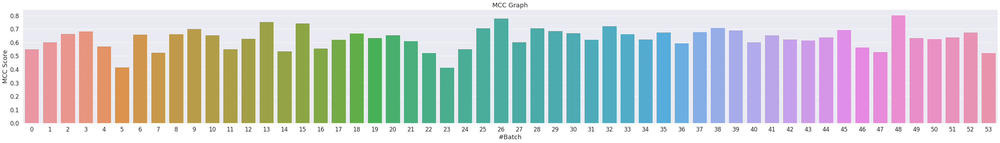

In [ ]:
g = sns.barplot(x = list(range(len(mat))), y = mat)

plt.title('MCC Graph')
plt.xlabel('#Batch')
plt.ylabel('MCC Score')
plt.rcParams['figure.figsize'] = (50, 6)

plt.show()

### Final MCC Score

In [ ]:
predx = np.concatenate(preds, axis = 0)
predm = np.argmax(predx, axis = 1).flatten()

labelm = np.concatenate(tl, axis = 0)

final_mcc = matthews_corrcoef(labelm, predm)
print('The Final MCC Score is {}'.format(final_mcc))

The Final MCC Score is 0.6317872659120937


### Line Graph for Loss

In [ ]:
sns.set(style = 'darkgrid')
sns.set(font_scale = 1.5)
plt.rcParams['figure.figsize'] = (12, 6)

plt.plot(statistics['Training Loss'], 'b-o', label = 'Training Loss')
plt.plot(statistics['Validation Loss'], 'g-o', label = 'Validation Loss')

plt.title('Performance Visualization for Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.legend()
plt.xticks([1, 2, 3, 4])

plt.show()

### Groupby Drug Name and Conditions

In [ ]:
f = df1.iloc[:, [1, 2]]
f = f.set_index(['drugName', 'condition'])
f = f.sort_index()
f.head(20)

Empty DataFrame
Columns: []
Index: [(A + D Cracked Skin Relief, Bacterial Skin Infection), (A / B Otic, Otitis Media), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abacavir / dolutegravir / lamivudine, HIV Infection), (Abatacept, Rheumatoid Arthritis), (Abatacept, Rheumatoid Arthritis), (Abatacept, Rheumatoid Arthritis), (Abatacept, Rheumatoid Arthritis), (Abatacept, Rheumatoid Arthritis), (Abatacept, Rheumatoid Arthritis), (Abilify, 3</span> users found this comment helpful.), (Abilify, Agitated State), (Abilify, Agitated State), (Abilify, Agitated State)]

In [ ]:
drugs = f.index.get_level_values(0)
drugs = drugs.to_numpy()
drugs = np.unique(drugs)
print(drugs)

['Abacavir / dolutegravir / lamivudine' 'Abilify' 'Abilify Discmelt' ...
 'Zytiga' 'ella' 'femhrt']


### Multiple Pie Charts for Conditions Distributions per Drug

Drug <-- Conditions


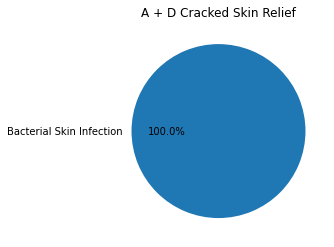

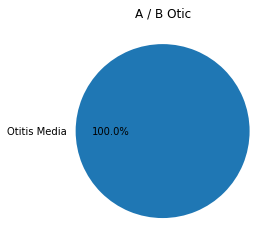

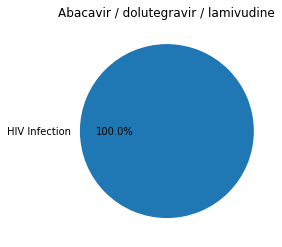

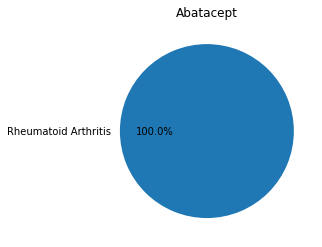

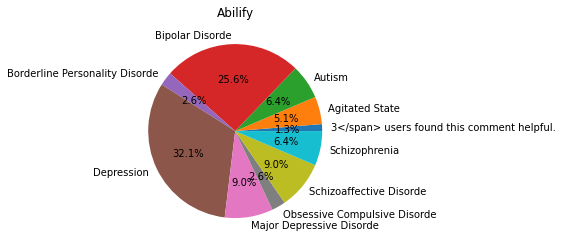

...

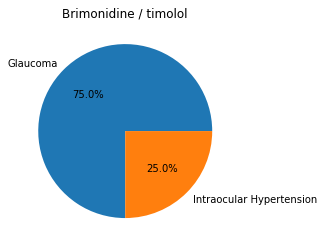

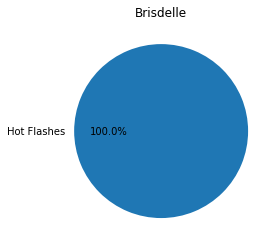

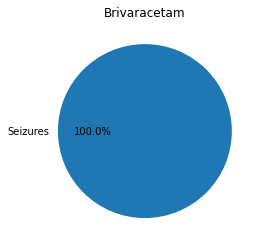

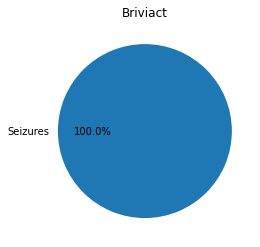

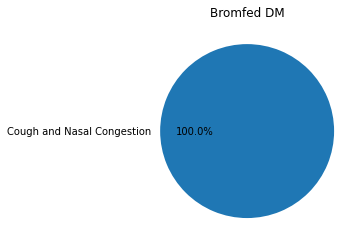

KeyboardInterrupt: ignored

In [ ]:
print("Drug <-- Conditions")

for d in drugs:
  j = f.loc[d]
  k = j.index.values
  c = Counter(k)
  keys = list(c.keys())
  values = list(c.values())

  plt.pie(x = values, labels = keys, autopct = "%1.1f%%")
  plt.title(d)
  plt.show()

### Groupby Drug Name, Conditions and, Reccomendations

In [ ]:
rating = df1['rating']
rating = rating.apply(lambda x: 1 if x >= 5.0 else 0)
df1['rating'] = rating
f = df1.iloc[:, [1, 2, 4]]
f = f.set_index(['drugName', 'condition', 'rating'])
f = f.sort_index()
f.head(20)

Empty DataFrame
Columns: []
Index: [(Abacavir / dolutegravir / lamivudine, HIV Infection, 1), (Abacavir / dolutegravir / lamivudine, HIV Infection, 1), (Abilify, Bipolar Disorde, 0), (Abilify, Bipolar Disorde, 0), (Abilify, Bipolar Disorde, 0), (Abilify, Bipolar Disorde, 1), (Abilify, Bipolar Disorde, 1), (Abilify, Depression, 0), (Abilify, Major Depressive Disorde, 0), (Abilify, Major Depressive Disorde, 1), (Abilify, Obsessive Compulsive Disorde, 1), (Abilify, Schizoaffective Disorde, 1), (Abilify, Tourette's Syndrome, 1), (Abilify Discmelt, Depression, 1), (Abreva, Herpes Simplex, 0), (Acamprosate, Alcohol Dependence, 1), (Acamprosate, Alcohol Dependence, 1), (Acamprosate, Alcohol Dependence, 1), (Acamprosate, Alcohol Dependence, 1), (Accutane, Acne, 0)]

### Multiple Heatmaps for Drug Reccomendation based on Conditions

Drug <-- Conditions <-- Reccomend (Yes / No)


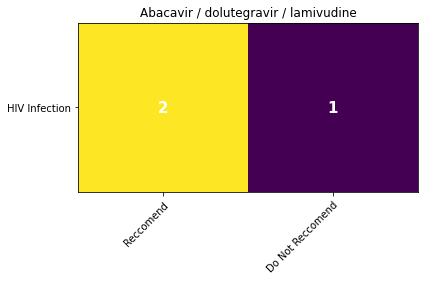

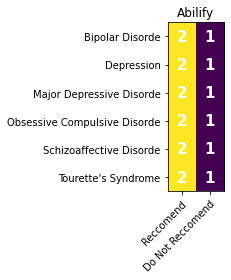

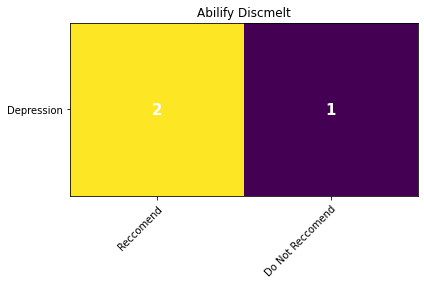

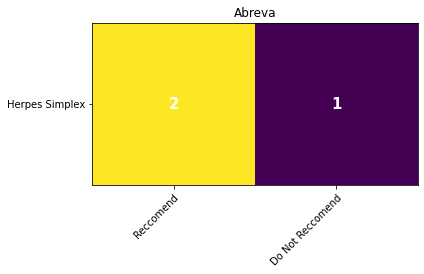

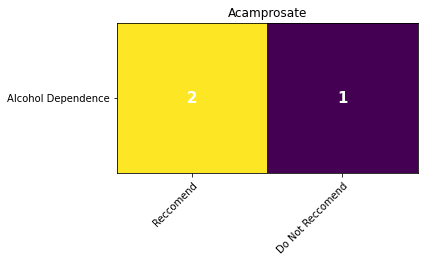

...

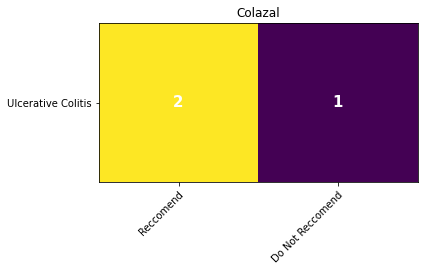

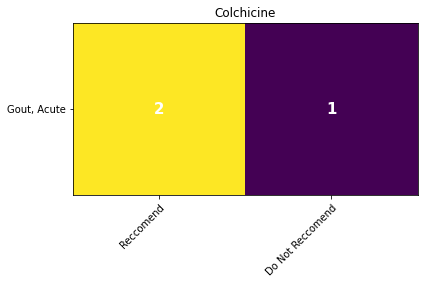

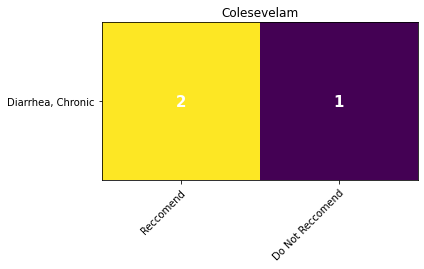

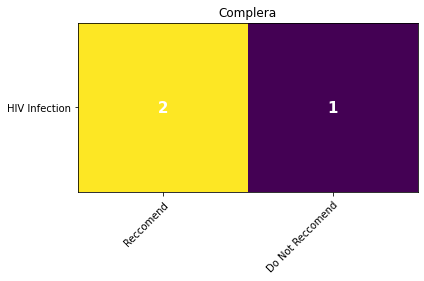

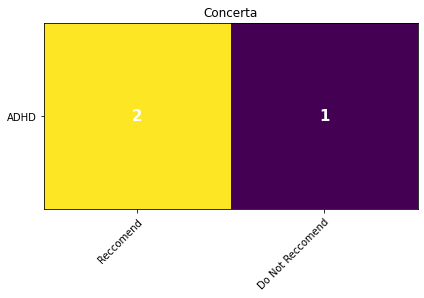

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:27: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.


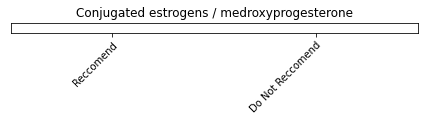

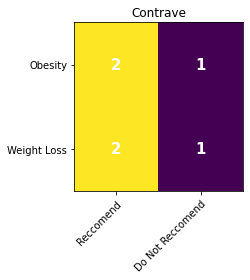

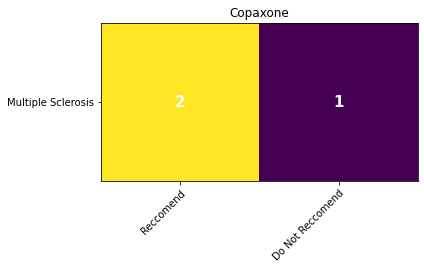

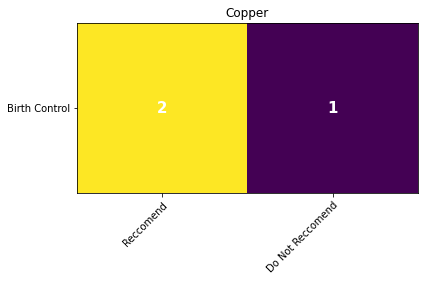

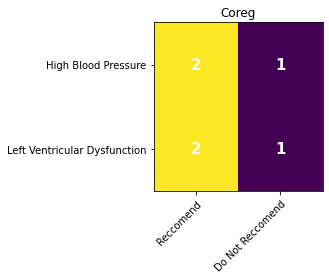

...

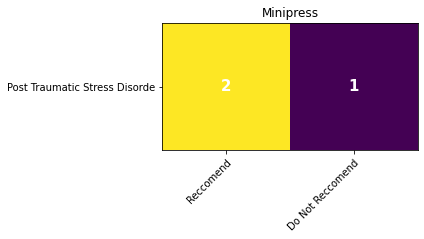

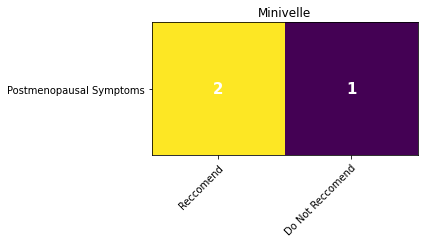

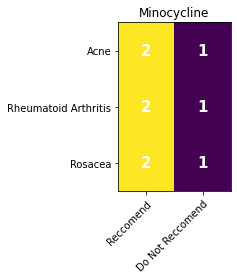

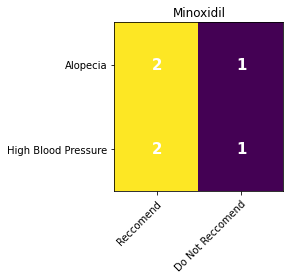

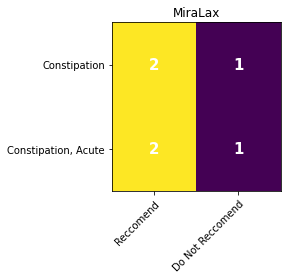

KeyboardInterrupt: ignored

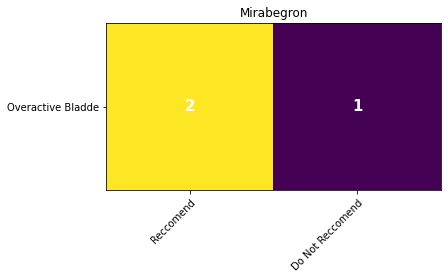

In [ ]:
print("Drug <-- Conditions <-- Reccomend (Yes / No)")

for d in drugs:
  dd = f.loc[d]
  conditions = dd.index.get_level_values(0)
  conditions = conditions.to_numpy()
  conditions = [str(i) for i in conditions]
  conditions = np.unique(conditions).tolist()
  conditions = [x for x in conditions if x != 'nan']
  Yes = []
  No = []
  for c in conditions:
    cd = dd.loc[c]
    v = cd.index.get_level_values(0)
    v = v.tolist()
    y = int(k.count(1))
    n = int(k.count(0))
    Yes.append(y)
    No.append(n)

  
  conditions = conditions
  classes = ['Reccomend', 'Do Not Reccomend']
  vals = np.column_stack((Yes, No))

  fig, ax = plt.subplots()
  im = ax.imshow(vals)

  ax.set_xticks(np.arange(len(classes)))
  ax.set_yticks(np.arange(len(conditions)))

  ax.set_xticklabels(classes)
  ax.set_yticklabels(conditions)

  plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
          rotation_mode="anchor")

  for i in range(len(conditions)):
      for j in range(len(classes)):
          text = ax.text(j, i, vals[i, j],
                        ha="center", va="center", color="w", fontweight = "bold", fontsize = 15)

  ax.set_title(d)
  fig.tight_layout()
  plt.show()

### Bar Plot for Accuracy

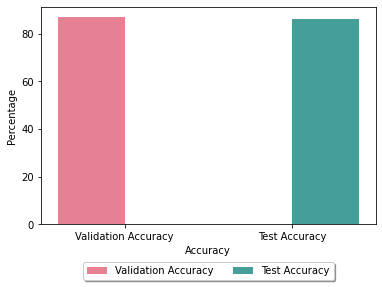

In [ ]:
val_acc = 87
test_acc = 86
bar_x = ['Validation Accuracy', 'Test Accuracy']
bar_y = [val_acc, test_acc]
db = {'Accuracy' : bar_x, 'Percentage' : bar_y}
db = pd.DataFrame(db)
sns.barplot(x = 'Accuracy', y = 'Percentage', hue = 'Accuracy', data = db, palette = "husl")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3)
plt.show()